
Processing video-xEYBrQ5tarcDbiw9p-frame-008799-Y4oEGegi75yWeHdja.jpg...


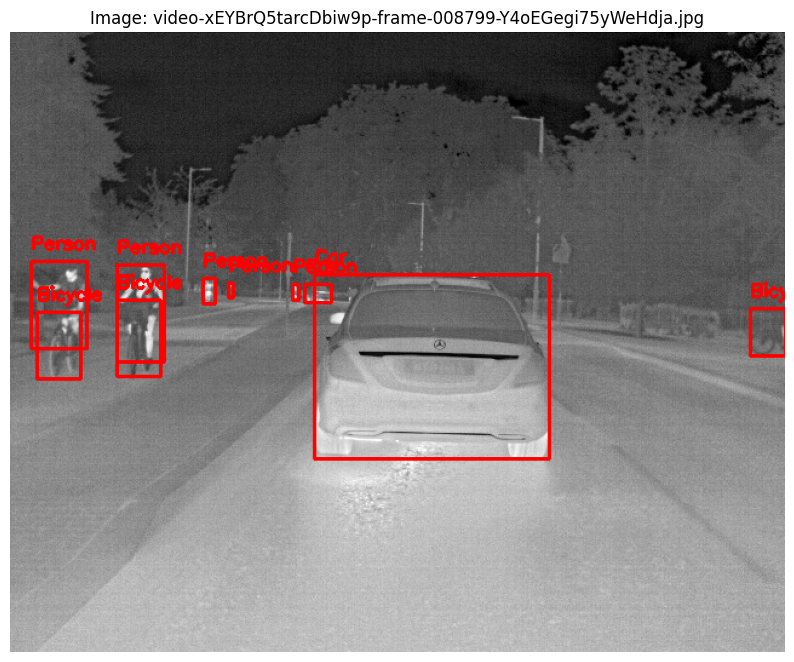


Processing video-BvDJ7TewksQCjCtyN-frame-001116-wbZbFk7d43zfvLtEg.jpg...


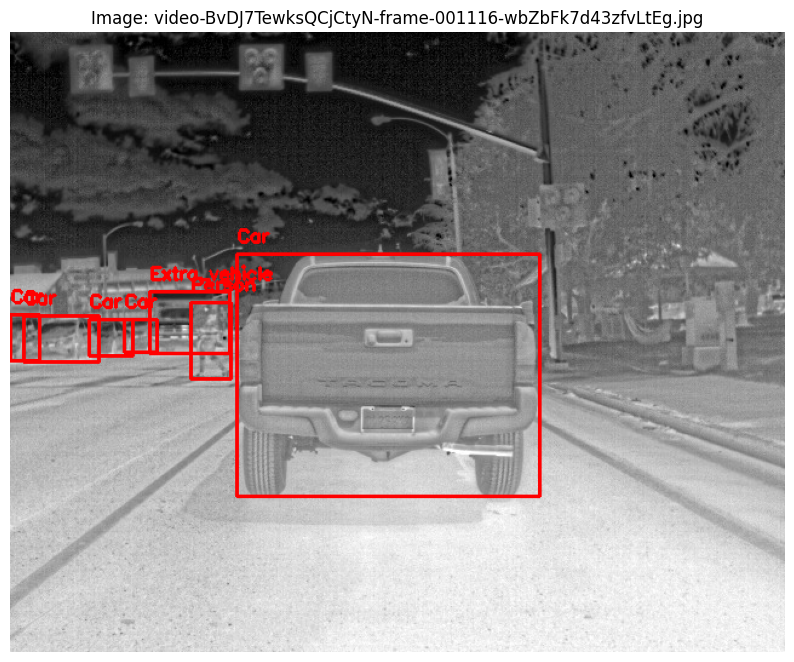


Processing video-TxNGEKRyWMf6Q7hS2-frame-000082-QFPewAukP2vj7bvBC.jpg...


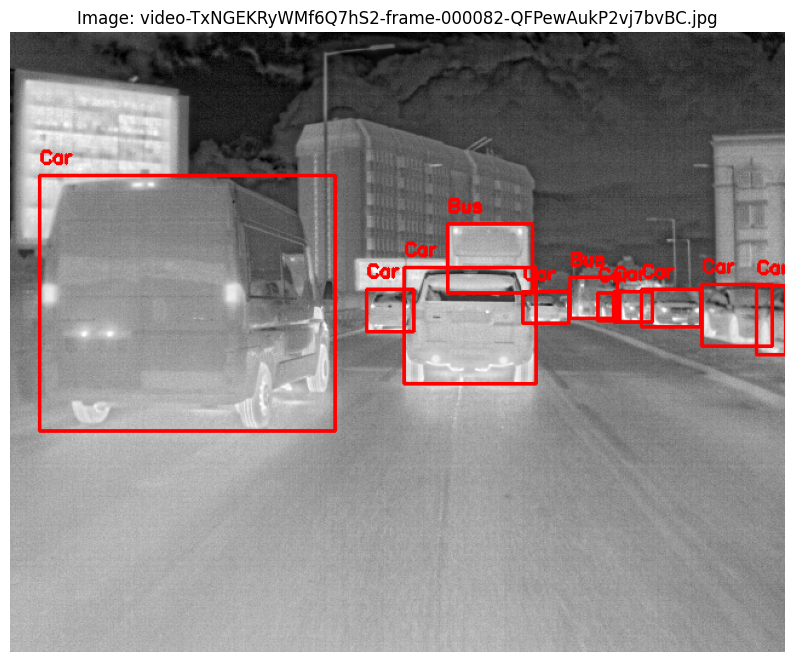


Processing train_2642.png...


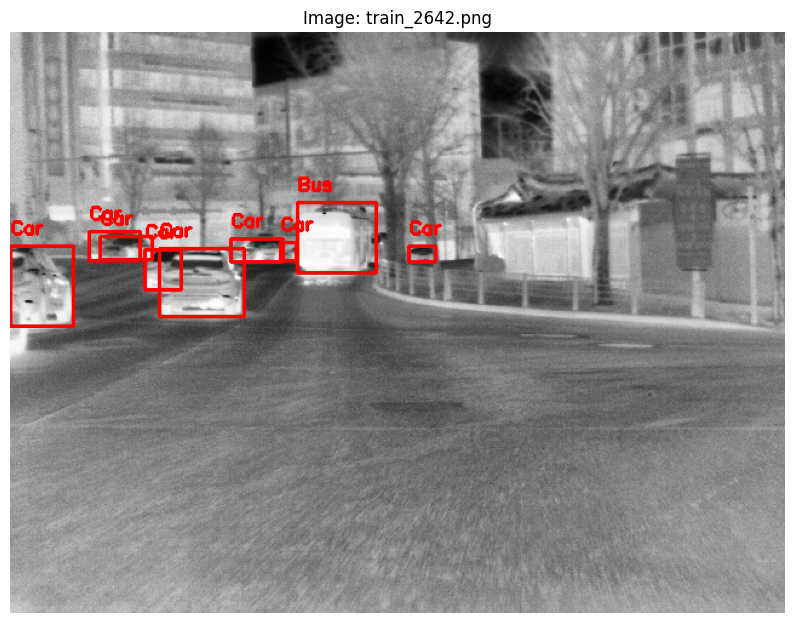


Processing train_5551.png...


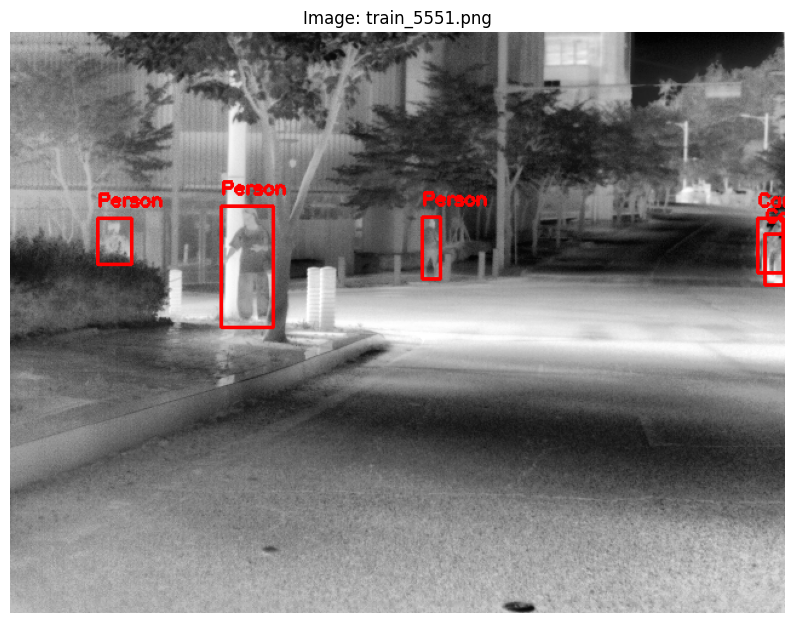


Processing video-TxNGEKRyWMf6Q7hS2-frame-000301-NSN44mP5kydktPge5.jpg...


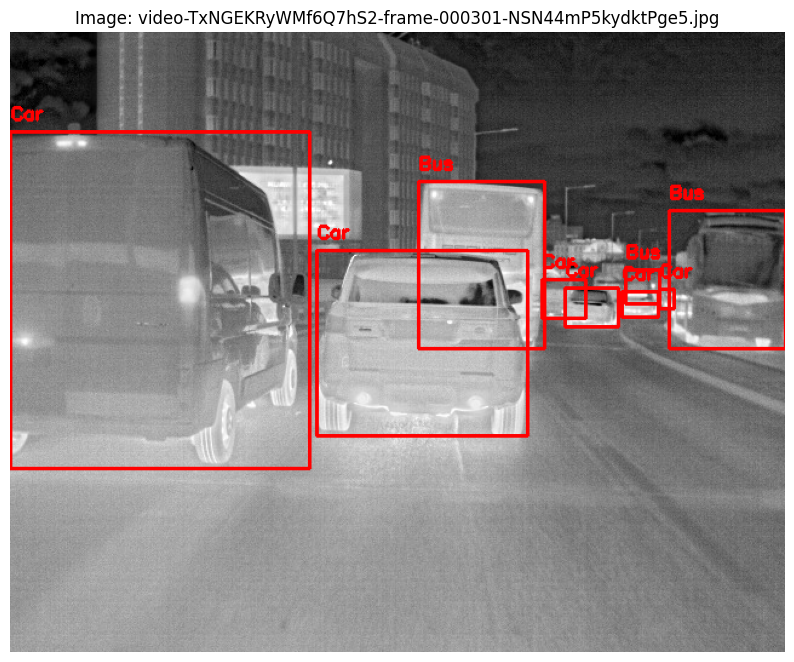


Processing video-JFiGa9oAAN2queuLt-frame-003717-wHScwWTBoeJTvCeEb.jpg...


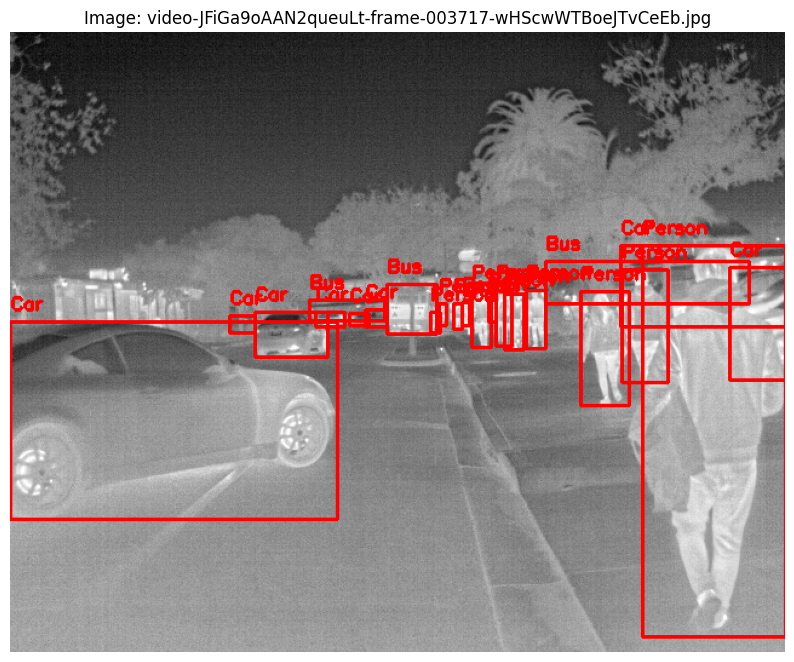


Processing video-KTtJnXH7CcPgLeF2G-frame-003973-hmeZLMt9GpRZdqjCn.jpg...


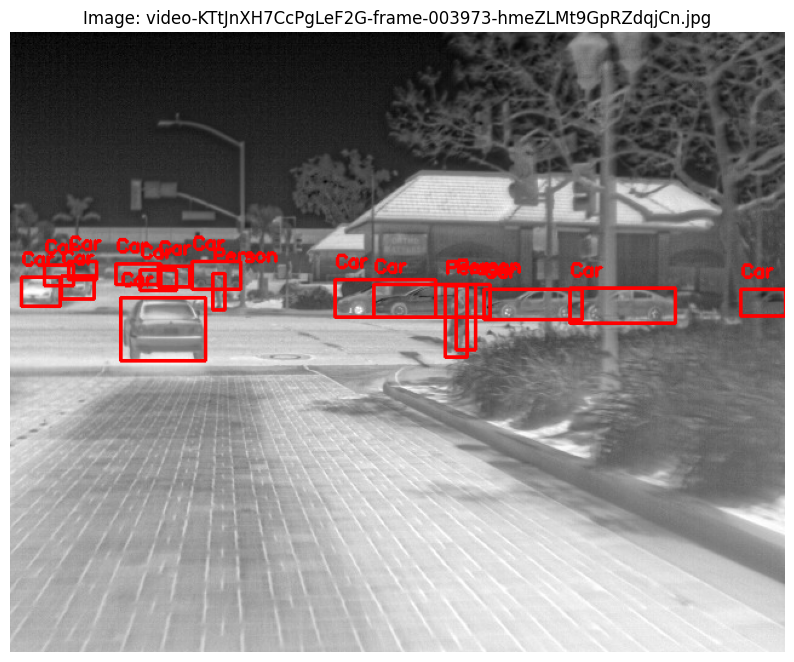


Processing train_3002.png...


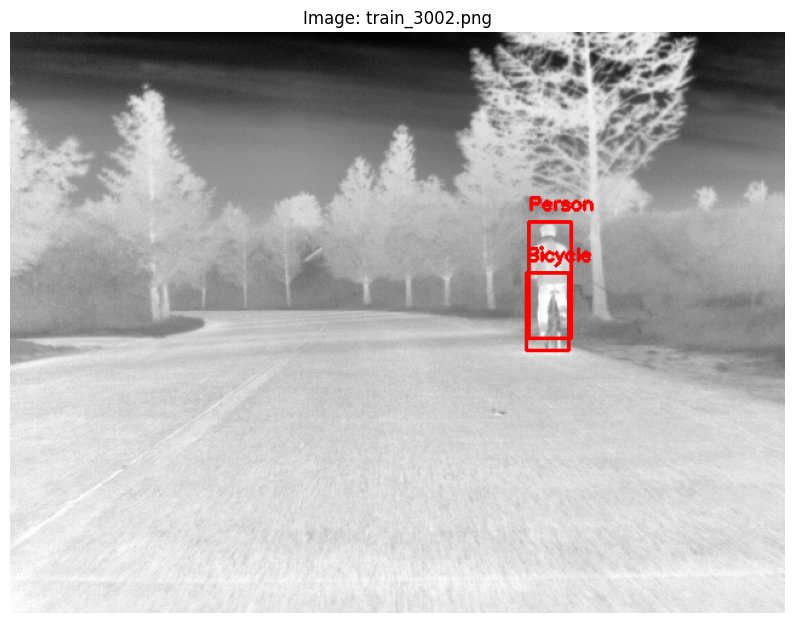


Processing train_4852.png...


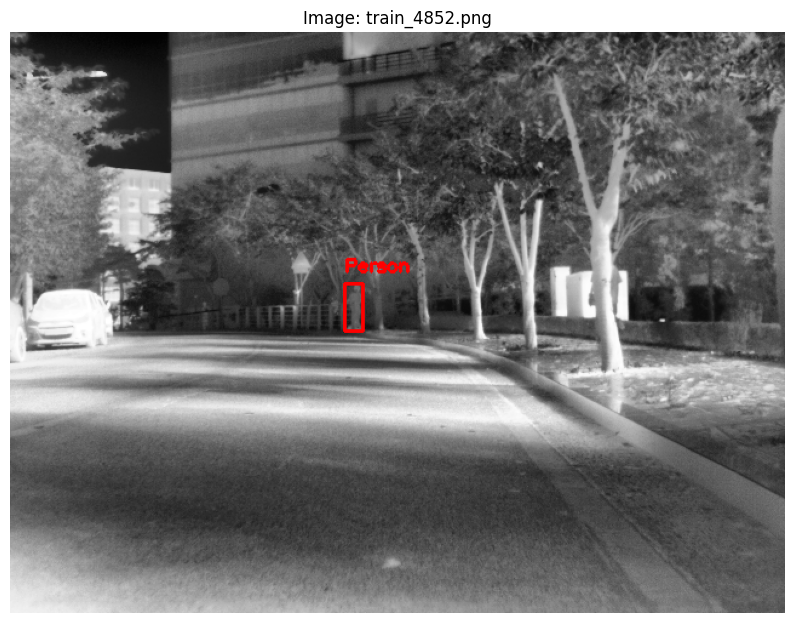


Processing video-5HPT2goT53ceRpvRm-frame-000870-mNvnyvwrkpaHLXaf3.jpg...


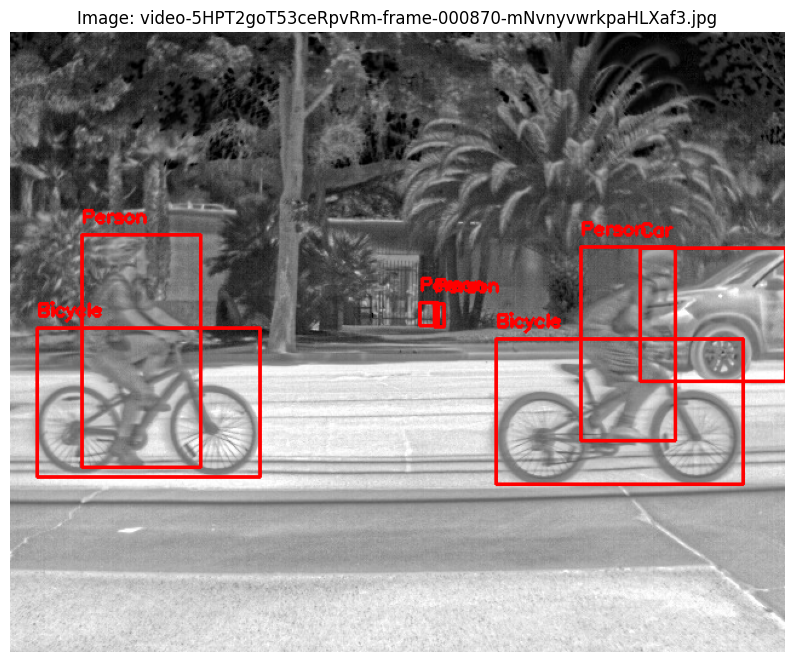


Processing video-r68Yr9RPWEp5fW2ZF-frame-006826-ar4GAHgYrMZi2Kejk.jpg...


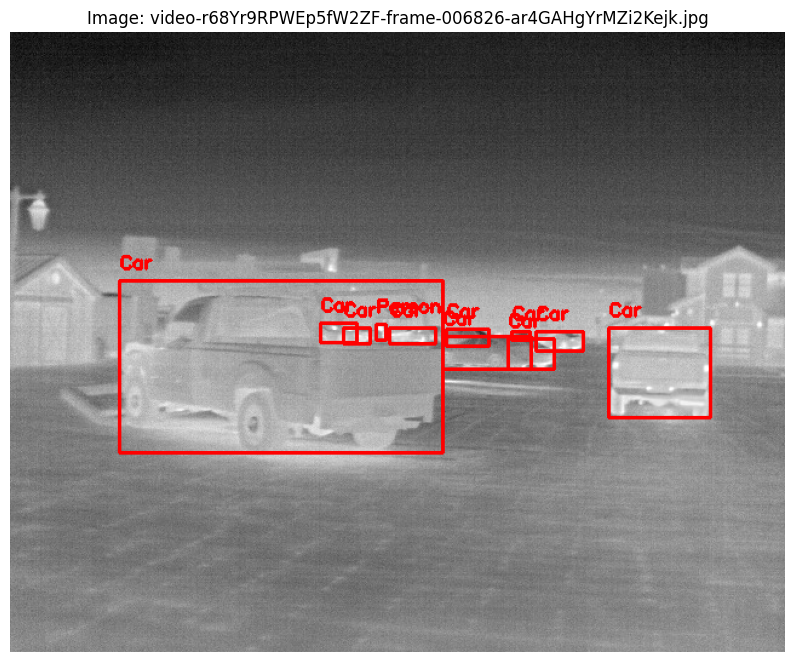


Processing video-vvYEi6EdCrYXeHwpD-frame-016524-fjiso6KpwjJA9hYEC.jpg...


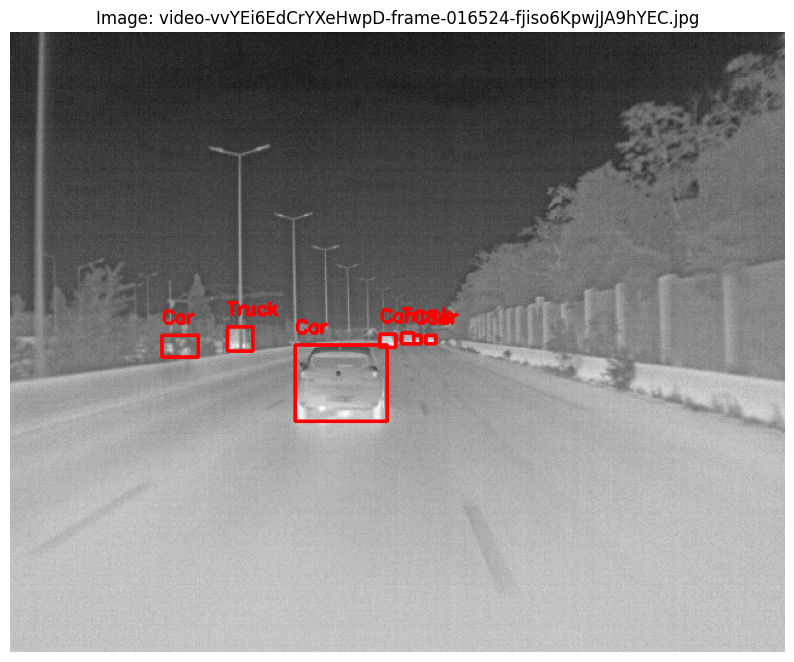


Processing video-jNQtRj6NGycZDEXpe-frame-014576-HL5omyJaLFTgrf85h.jpg...


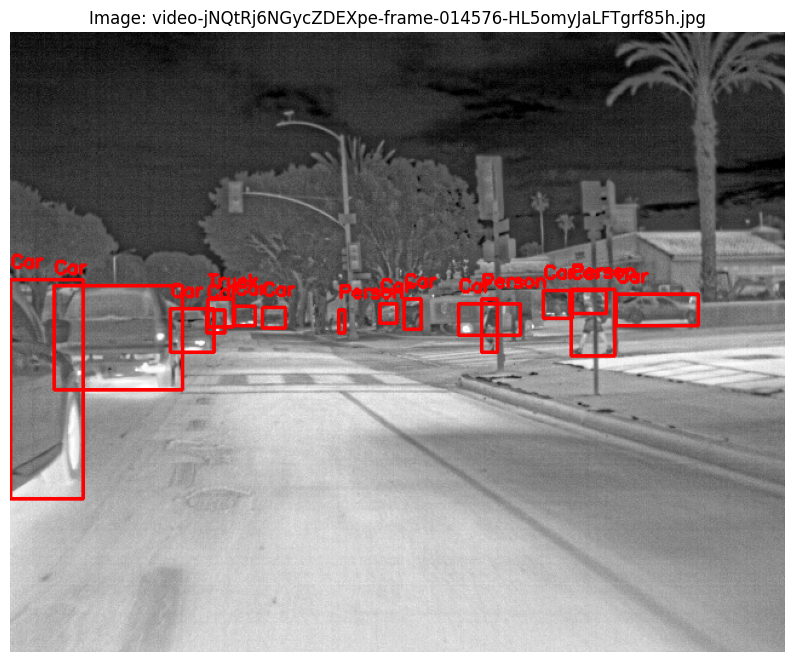


Processing video-iTrM5ner4KQGLvpdC-frame-003127-HEeLEC8mRbpudmi2y.jpg...


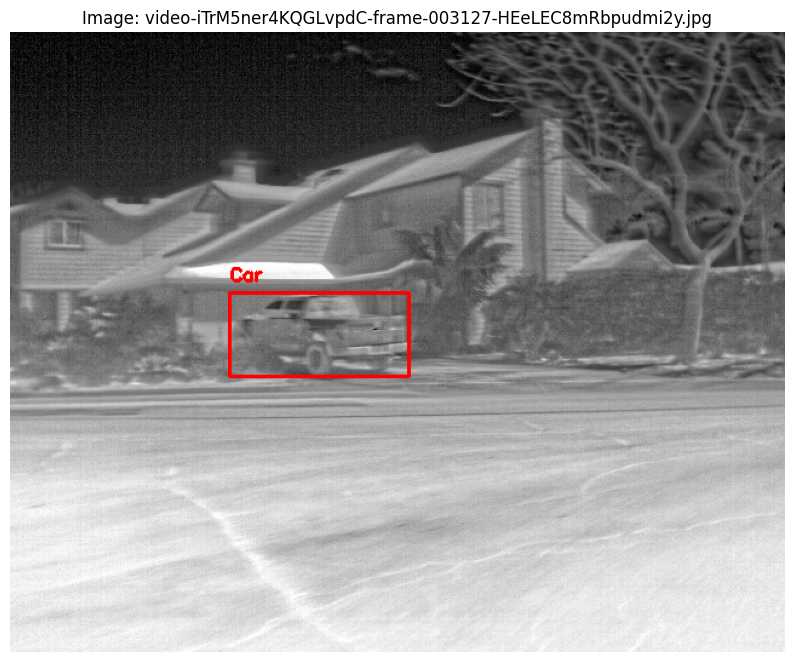


Processing train_3397.png...


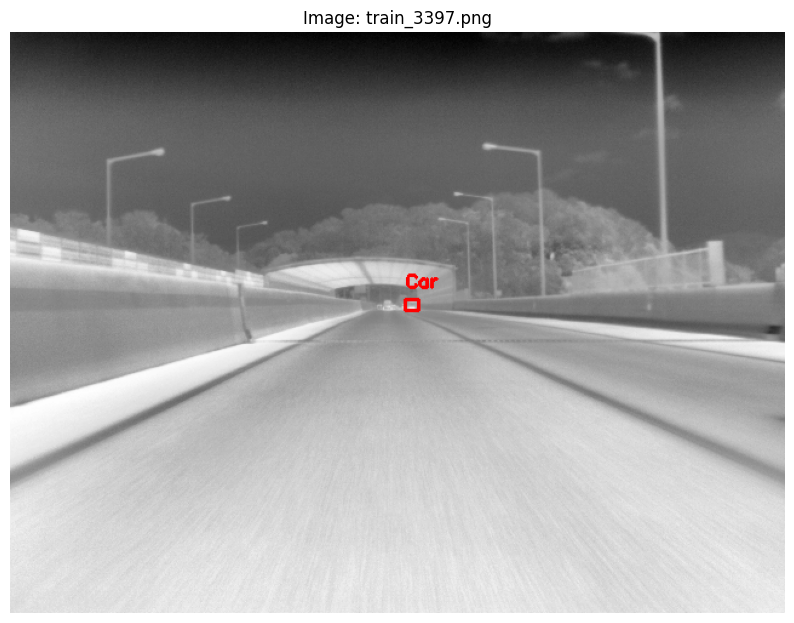


Processing video-kZvY7NeD8kA7PiMWX-frame-004155-PozuaRWacx7gm6KrK.jpg...


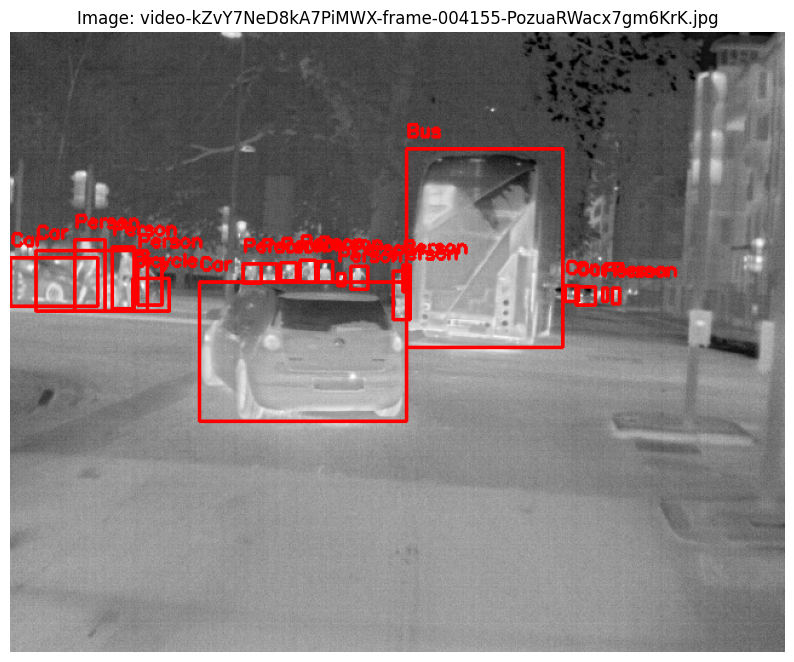


Processing video-AkvAvb4X72cnTbbCw-frame-000290-KZxEYwmwy3f7cjkoY.jpg...


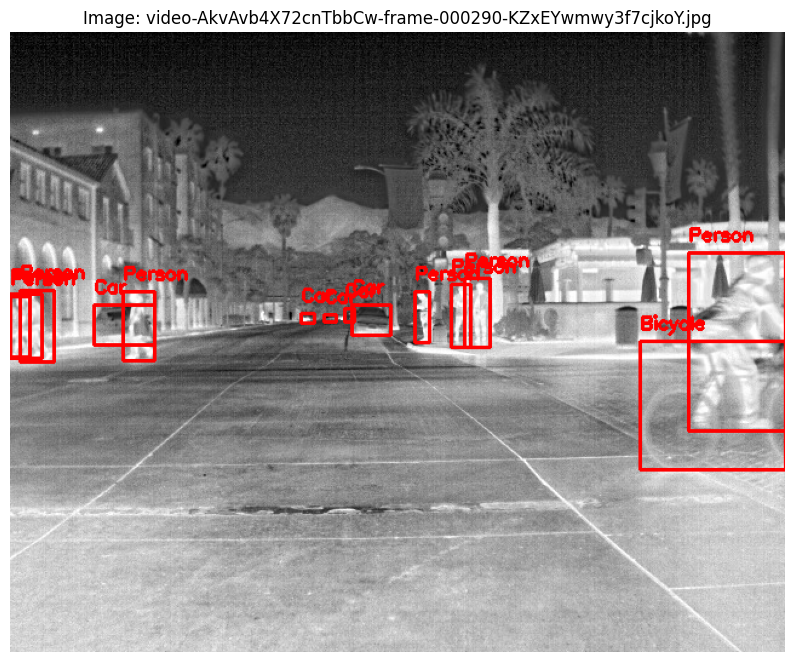


Processing video-Gj7ejTPCZZnD5YwPv-frame-001392-CtuYBbixQawLdwrE4.jpg...


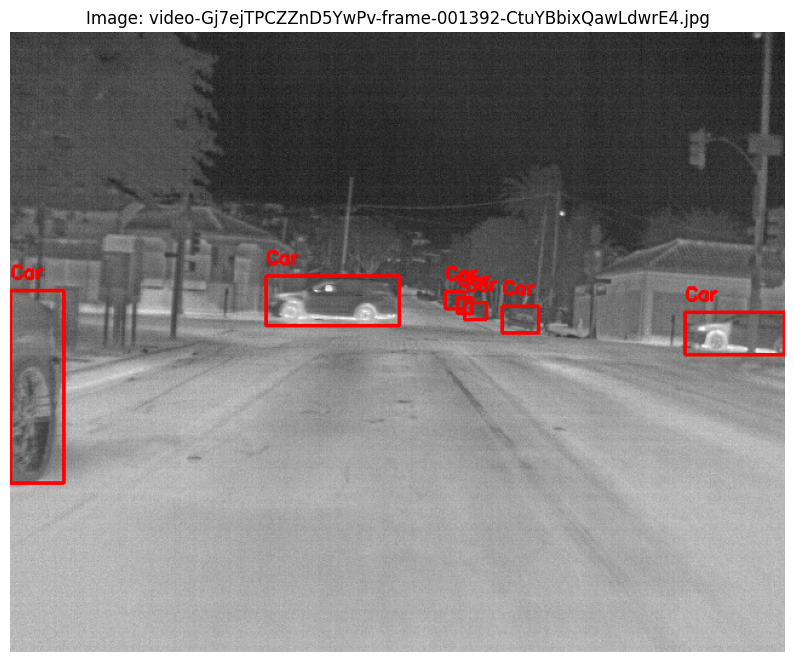


Processing video-vvYEi6EdCrYXeHwpD-frame-008568-q4urx8SZJbFGLCrc7.jpg...


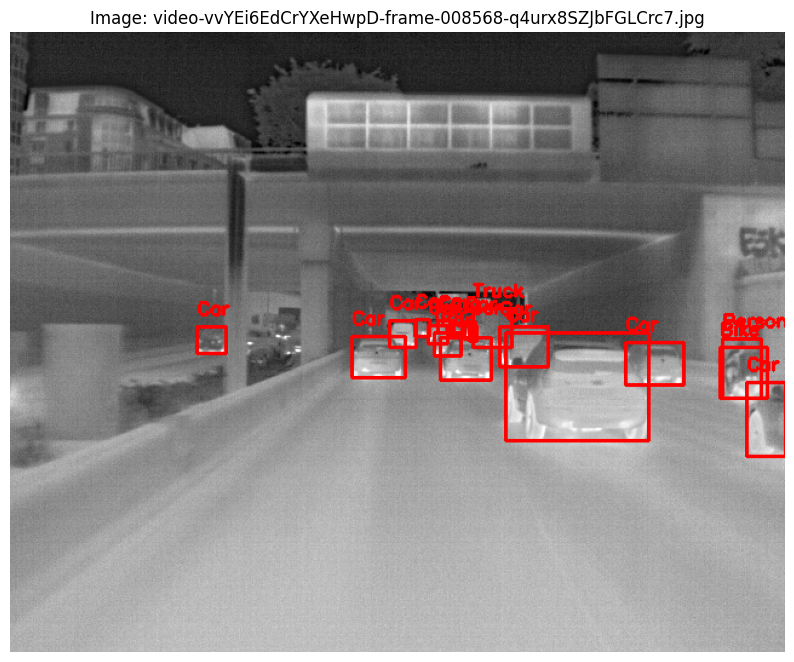

In [7]:
import cv2
import matplotlib.pyplot as plt
import os
import random

# Function to load YOLO labels from a file and return bounding boxes and class labels
def load_yolo_labels(label_file, image_width, image_height):
    bboxes = []
    try:
        with open(label_file, 'r') as file:
            lines = file.readlines()
            for line in lines:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                # Convert normalized YOLO format back to original image coordinates
                x_min = int((x_center - width / 2) * image_width)
                y_min = int((y_center - height / 2) * image_height)
                x_max = int((x_center + width / 2) * image_width)
                y_max = int((y_center + height / 2) * image_height)
                bboxes.append((int(class_id), x_min, y_min, x_max, y_max))
    except FileNotFoundError:
        print(f"Label file not found: {label_file}")
    except Exception as e:
        print(f"Error reading label file {label_file}: {e}")
    return bboxes

# Function to draw bounding boxes on an image
def draw_bboxes(image, bboxes, labels):
    for bbox in bboxes:
        class_id, x_min, y_min, x_max, y_max = bbox
        label = labels[int(class_id)]
        # Draw bounding box
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        # Add label text above the bounding box
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    return image

# Function to randomly pick 5 images and show bounding boxes for validation
def visualize_random_images_with_bboxes(image_directory, label_directory, custom_labels, num_images=5):
    # List all images in the directory
    image_files = [f for f in os.listdir(image_directory) if (f.endswith('.jpg') or f.endswith('.png'))]


    if len(image_files) == 0:
        print(f"No images found in {image_directory}")
        return
    
    selected_images = random.sample(image_files, min(num_images, len(image_files)))
    selected_images[0] ='video-xEYBrQ5tarcDbiw9p-frame-008799-Y4oEGegi75yWeHdja.jpg'

    for image_file in selected_images:
        print(f"\nProcessing {image_file}...")

        # Load image
        image_path = os.path.join(image_directory, image_file)
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Error: Could not read image {image_path}")
            continue
        
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

        # Generate the label file path based on the image file extension
        if image_file.endswith('.jpg'):
            label_file = os.path.join(label_directory, image_file.replace('.jpg', '.txt'))
        elif image_file.endswith('.png'):
            label_file = os.path.join(label_directory, image_file.replace('.png', '.txt'))


        # Check if label file exists
        if os.path.exists(label_file):
            image_height, image_width, _ = image.shape
            bboxes = load_yolo_labels(label_file, image_width, image_height)

            # If bounding boxes are found, draw them
            if bboxes:
                image_with_bboxes = draw_bboxes(image_rgb.copy(), bboxes, custom_labels)

                # Display the image using matplotlib
                plt.figure(figsize=(10, 10))
                plt.imshow(image_with_bboxes)
                plt.title(f"Image: {image_file}")
                plt.axis('off')
                plt.show()
            else:
                print(f"No bounding boxes found for {image_file}")
        else:
            print(f"Label file not found for {image_file}")

# Define your custom labels (same as used in YOLO labels)
custom_labels = ['Person', 'Car', 'Truck', 'Bus', 'Bicycle', 'Bike', 'Extra_vehicle', 'Dog']

# Call the function to visualize randomly selected images
image_directory = "/workspace/MLV_IR_OD/datasets/unified_dataset/images/train"  # Directory containing images
label_directory = "/workspace/MLV_IR_OD/datasets/unified_dataset/labels/train"  # Directory containing YOLO label .txt files
visualize_random_images_with_bboxes(image_directory, label_directory, custom_labels, num_images=20)
